<div style="padding:20px;color:white;margin:0;font-size:300%;text-align:center;display:fill;border-radius:80px;background-color:#7A7A7A;overflow:hidden;font-weight:800">
Global Suicide</div>

In [1]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/global-suicide-rates-1990-to-2022/age_std_suicide_rates_1990-2022.csv
/kaggle/input/global-suicide-rates-1990-to-2022/suicide_rates_1990-2022.csv


## <b><div style='padding:15px;background-color:#7A7A7A;color:white;border-radius:40px;font-size:110%;text-align: center'>1  |  About Dataset</div></b>

Ever wondered what factors might be behind the heartbreaking reality of suicide rates around the world? This dataset dives deep into the numbers, spanning over 30 years from 1990 to 2022, to help us understand the complex relationship between suicide and various elements of our lives.

**What's in it for you?**

Suicide rates galore: Not just raw counts, but percentages of total deaths and standardized rates that account for different population age structures.
Demographics on deck: Region, country, year, gender, age group - you name it, this dataset's got it covered.

Economic insights: GDP, income levels, inflation, employment rates - a treasure trove of socioeconomic indicators to explore their potential links to suicide rates.

## <b><div style='padding:15px;background-color:#7A7A7A;color:white;border-radius:40px;font-size:110%;text-align: center'>2  |  Libraries</div></b>

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.offline as pyo 
import plotly.io as pio


import warnings
warnings.filterwarnings('ignore')

## <b><div style='padding:15px;background-color:#7A7A7A;color:white;border-radius:40px;font-size:110%;text-align: center'>3  |  Dataset</div></b>

In [3]:
df = pd.read_csv('/kaggle/input/global-suicide-rates-1990-to-2022/suicide_rates_1990-2022.csv')


In [4]:
# Check Dataset

print('### first 5 lines ###','\n')
df.head()

### first 5 lines ### 



,RegionCode,RegionName,CountryCode,CountryName,Year,Sex,AgeGroup,Generation,SuicideCount,CauseSpecificDeathPercentage,DeathRatePer100K,Population,GDP,GDPPerCapita,GrossNationalIncome,GNIPerCapita,InflationRate,EmploymentPopulationRatio
0,EU,Europe,ALB,Albania,1992,Male,0-14 years,Generation Alpha,0.0,0.000000,0.000000,3247039.0,652174990.8,200.85222,906184212.3,1740.0,226.005421,45.315
1,EU,Europe,ALB,Albania,1992,Male,0-14 years,Generation Alpha,0.0,0.000000,0.000000,3247039.0,652174990.8,200.85222,906184212.3,1740.0,226.005421,45.315
2,EU,Europe,ALB,Albania,1992,Male,0-14 years,Generation Alpha,0.0,0.000000,0.000000,3247039.0,652174990.8,200.85222,906184212.3,1740.0,226.005421,45.315
3,EU,Europe,ALB,Albania,1992,Male,0-14 years,Generation Alpha,0.0,0.000000,0.000000,3247039.0,652174990.8,200.85222,906184212.3,1740.0,226.005421,45.315
4,EU,Europe,ALB,Albania,1992,Male,15-24 years,Generation Z,5.0,3.401361,3.531073,3247039.0,652174990.8,200.85222,906184212.3,1740.0,226.005421,45.315


## <b><div style='padding:15px;background-color:#7A7A7A;color:white;border-radius:40px;font-size:110%;text-align: center'>4  |  Inspecting and Cleaning Dataframe Structure</div></b>

In [5]:
# Dataframe summary

def summary(df):
    print(f'data shape: {df.shape}')
    summ = pd.DataFrame(df.dtypes, columns=['Data Type'])
    summ['Missing#'] = df.isna().sum()
    summ['Missing%'] = (df.isna().sum())/len(df)
    summ['Dups'] = df.duplicated().sum()
    summ['Uniques'] = df.nunique().values
    summ['Count'] = df.count().values
    desc = pd.DataFrame(df.describe(include='all').transpose())
    summ['Min'] = desc['min'].values
    summ['Max'] = desc['max'].values
    summ['Average'] = desc['mean'].values
    summ['Standard Deviation'] = desc['std'].values
    summ['First Value'] = df.loc[0].values
    summ['Second Value'] = df.loc[1].values
    summ['Third Value'] = df.loc[2].values

    display(summ)

summary(df)

data shape: (118560, 18)


,Data Type,Missing#,Missing%,Dups,Uniques,Count,Min,Max,Average,Standard Deviation,First Value,Second Value,Third Value
RegionCode,object,0,0.000000,22584,6,118560,NaN,NaN,NaN,NaN,EU,EU,EU
RegionName,object,0,0.000000,22584,6,118560,NaN,NaN,NaN,NaN,Europe,Europe,Europe
CountryCode,object,0,0.000000,22584,117,118560,NaN,NaN,NaN,NaN,ALB,ALB,ALB
CountryName,object,0,0.000000,22584,117,118560,NaN,NaN,NaN,NaN,Albania,Albania,Albania
Year,int64,0,0.000000,22584,33,118560,1990.0,2022.0,2005.740047,8.745003,1992,1992,1992
Sex,object,0,0.000000,22584,3,118560,NaN,NaN,NaN,NaN,Male,Male,Male
AgeGroup,object,0,0.000000,22584,7,118560,NaN,NaN,NaN,NaN,0-14 years,0-14 years,0-14 years
Generation,object,0,0.000000,22584,7,118560,NaN,NaN,NaN,NaN,Generation Alpha,Generation Alpha,Generation Alpha
SuicideCount,float64,464,0.003914,22584,1868,118096,0.0,6787.0,63.632037,254.095408,0.0,0.0,0.0
CauseSpecificDeathPercentage,float64,4289,0.036176,22584,46425,114271,0.0,100.0,3.87369,7.31782,0.0,0.0,0.0


<div class="alert alert-block alert-info" style="background-color:#F0EEED;color:#7a7a7a;border-color:black;width:80%;margin: auto;text-align: center;"><b>Insight: </b>I believe the 2022 data is incomplete. So, let's delete them.</div>

In [6]:
# Excluding 2022 data

index_names = df[ df['Year'] == 2022 ].index

df.drop(index_names, inplace = True)

In [7]:
# Null Data

print('### Total Null Data in DataFrame ###','\n')
df.isnull().sum()

### Total Null Data in DataFrame ### 



RegionCode                          0
RegionName                          0
CountryCode                         0
CountryName                         0
Year                                0
Sex                                 0
AgeGroup                            0
Generation                          0
SuicideCount                      464
CauseSpecificDeathPercentage     4267
DeathRatePer100K                10636
Population                       5920
GDP                              7240
GDPPerCapita                     7240
GrossNationalIncome              9960
GNIPerCapita                    10760
InflationRate                   14460
EmploymentPopulationRatio       11120
dtype: int64

In [8]:
# Check duplicate data

print("Number of duplicates: " + str(df.duplicated().sum()))

Number of duplicates: 22504


<div class="alert alert-block alert-info" style="background-color:#F0EEED;color:#7a7a7a;border-color:black;width:80%;margin: auto;text-align: center;"><b>Insight: </b>We may see a lot of NaN and Duplicated, but we won't do anything about it.</div>

## <b><div style='padding:15px;background-color:#7A7A7A;color:white;border-radius:40px;font-size:110%;text-align: center'>5  |  Exploratory Data Analysis - EDA</div></b>

### <b><span style='color:#DEB078'>5.1 |</span><span style='color:#7A7A7A'> World</span></b>  

In [9]:
suicide_count = df.groupby('Year')['SuicideCount'].sum().reset_index()
death_rate = df.groupby('Year')['DeathRatePer100K'].sum().reset_index()

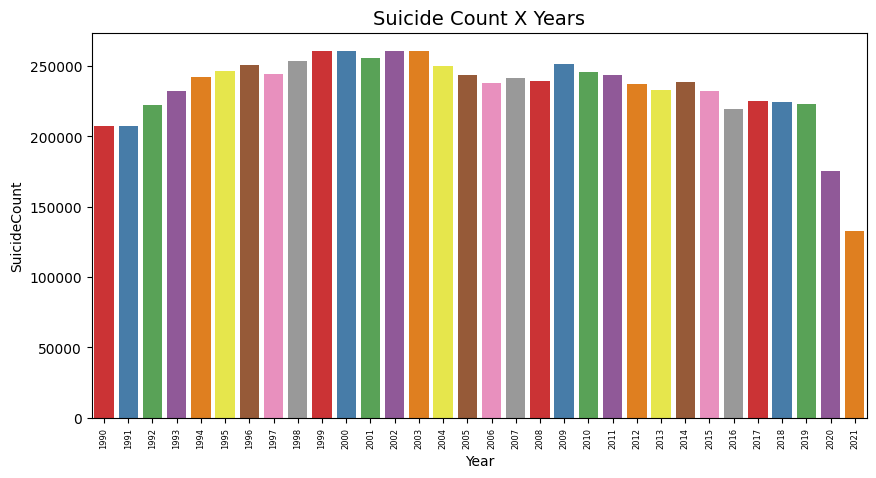

In [10]:
# Suicide Count X Years - World

fig, ax = plt.subplots(figsize=(10, 5))
sns.barplot(data=suicide_count, x = 'Year', y = 'SuicideCount', palette = 'Set1')
plt.title("Suicide Count X Years", fontsize = 14)
plt.xticks(rotation=90, fontsize = 6)
plt.show()

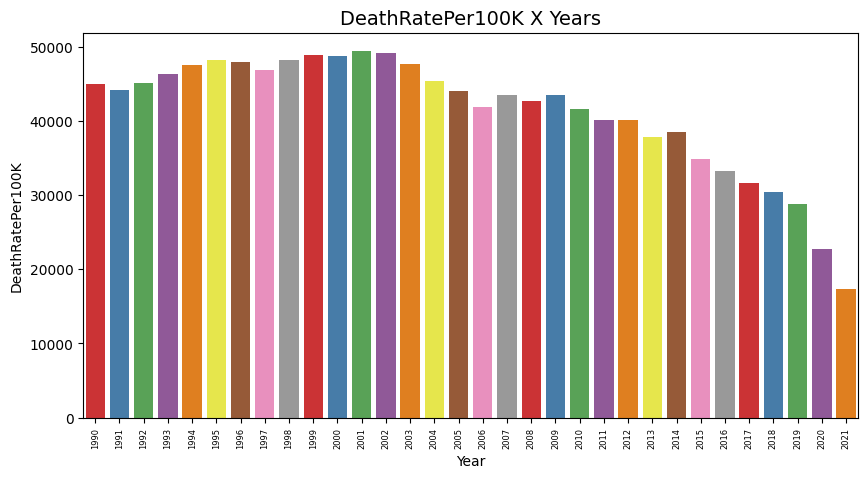

In [11]:
# DeathRatePer100K X Years - World

fig, ax = plt.subplots(figsize=(10, 5))
sns.barplot(data=death_rate, x = 'Year', y = 'DeathRatePer100K', palette = 'Set1')
plt.title("DeathRatePer100K X Years", fontsize = 14)
plt.xticks(rotation=90, fontsize = 6)
plt.show()

### <b><span style='color:#DEB078'>5.2 |</span><span style='color:#7A7A7A'> Generation</span></b> 

In [12]:
df['Generation'].unique()

array(['Generation Alpha', 'Generation Z', 'Millennials', 'Generation X',
       'Baby Boomers', 'Silent Generation', 'Unknown'], dtype=object)

In [13]:
# Create datasets
df_Alpha = df[df['Generation'] == 'Generation Alpha']
df_Z = df[df['Generation'] == 'Generation Z']
df_Mill = df[df['Generation'] == 'Millennials']
df_X = df[df['Generation'] == 'Generation X']
df_BB = df[df['Generation'] == 'Baby Boomers']
df_Silent = df[df['Generation'] == 'Silent Generation']

# Groupby - Year
suicide_Alpha = df_Alpha.groupby('Year')['SuicideCount'].sum().reset_index()
suicide_Z = df_Z.groupby('Year')['SuicideCount'].sum().reset_index()
suicide_Mill = df_Mill.groupby('Year')['SuicideCount'].sum().reset_index()
suicide_X = df_X.groupby('Year')['SuicideCount'].sum().reset_index()
suicide_BB = df_BB.groupby('Year')['SuicideCount'].sum().reset_index()
suicide_Silent = df_Silent.groupby('Year')['SuicideCount'].sum().reset_index()

# Rename columns
suicide_Alpha.rename(columns = {'SuicideCount':'Alpha'}, inplace = True)
suicide_Z.rename(columns = {'SuicideCount':'Z'}, inplace = True)
suicide_Mill.rename(columns = {'SuicideCount':'Mill'}, inplace = True)
suicide_X.rename(columns = {'SuicideCount':'X'}, inplace = True)
suicide_BB.rename(columns = {'SuicideCount':'BB'}, inplace = True)
suicide_Silent.rename(columns = {'SuicideCount':'Silent'}, inplace = True)

# Concat datasets 
suicide_generation = pd.concat([suicide_Alpha, suicide_Z, suicide_Mill, 
                               suicide_X, suicide_BB, suicide_Silent])

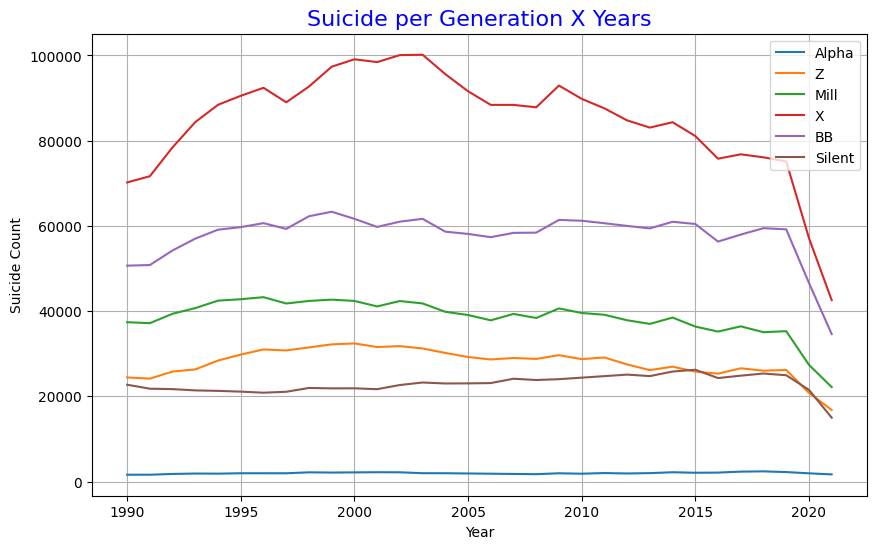

In [14]:
# Suicide per Generation X Years
suicide_generation.plot(x="Year", y=['Alpha', 'Z', 'Mill', 'X', 'BB', 'Silent'],
              kind="line", figsize=(10, 6))
plt.title("Suicide per Generation X Years", fontsize = 16, color = 'blue')
plt.ylabel('Suicide Count', rotation=90, fontsize = 10)

plt.grid()
plt.show()

<div class="alert alert-block alert-info" style="background-color:#F0EEED;color:#7a7a7a;border-color:black;width:80%;margin: auto;text-align: center;"><b>Insight: </b>We can see that the largest generation of suicides is "X" and the smallest is "Alpha".</div>

### <b><span style='color:#DEB078'>5.2 |</span><span style='color:#7A7A7A'> Region Name - Continent</span></b> 

In [15]:
df['RegionName'].unique()

array(['Europe', 'Central and South America', 'Asia', 'Oceania',
       'North America and the Caribbean', 'Africa'], dtype=object)

In [16]:
# Create datasets
df_Europe = df[df['RegionName'] == 'Europe']
df_Asia = df[df['RegionName'] == 'Asia']
df_Oceania = df[df['RegionName'] == 'Oceania']
df_Central_South_America = df[df['RegionName'] == 'Central and South America']
df_North_America_Caribbean = df[df['RegionName'] == 'North America and the Caribbean']
df_Africa = df[df['RegionName'] == 'Africa']

# Groupby - Year
suicide_Europe = df_Europe.groupby('Year')['SuicideCount'].sum().reset_index()
suicide_Asia = df_Asia.groupby('Year')['SuicideCount'].sum().reset_index()
suicide_Oceania = df_Oceania.groupby('Year')['SuicideCount'].sum().reset_index()
suicide_Central_South_America = df_Central_South_America.groupby('Year')['SuicideCount'].sum().reset_index()
suicide_North_America_Caribbean = df_North_America_Caribbean.groupby('Year')['SuicideCount'].sum().reset_index()
suicide_Africa = df_Africa.groupby('Year')['SuicideCount'].sum().reset_index()

# Rename columns
suicide_Europe.rename(columns = {'SuicideCount':'Europe'}, inplace = True)
suicide_Asia.rename(columns = {'SuicideCount':'Asia'}, inplace = True)
suicide_Oceania.rename(columns = {'SuicideCount':'Oceania'}, inplace = True)
suicide_Central_South_America.rename(columns = {'SuicideCount':'Central_South_America'}, inplace = True)
suicide_North_America_Caribbean.rename(columns = {'SuicideCount':'North_America_Caribbean'}, inplace = True)
suicide_Africa.rename(columns = {'SuicideCount':'Africa'}, inplace = True)

# Concat datasets 
suicide_continent = pd.concat([suicide_Europe, suicide_Asia, suicide_Oceania, 
                               suicide_Central_South_America,
                              suicide_North_America_Caribbean, suicide_Africa])

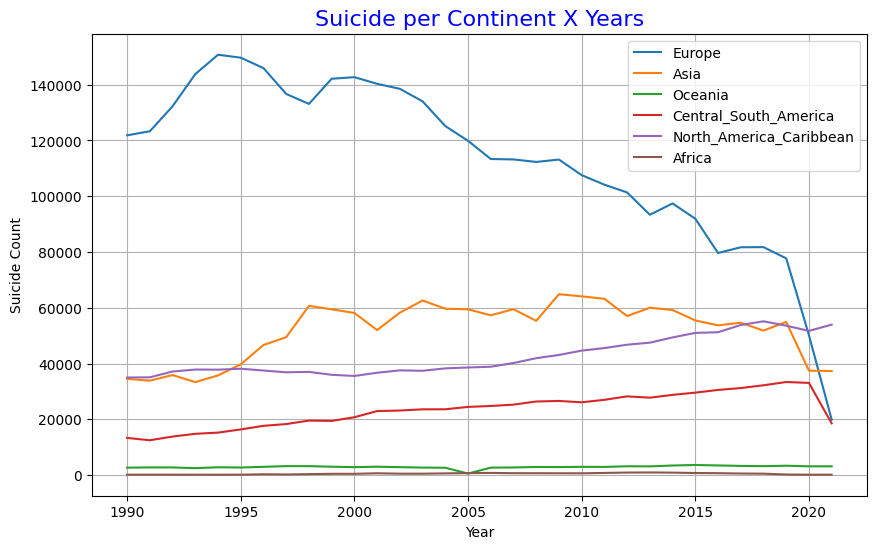

In [17]:
# Suicide per Continent X Years
suicide_continent.plot(x="Year", y=['Europe', 'Asia', 'Oceania', 'Central_South_America',
                     'North_America_Caribbean', 'Africa'],
              kind="line", figsize=(10, 6))
plt.title("Suicide per Continent X Years", fontsize = 16, color = 'blue')
plt.ylabel('Suicide Count', rotation=90, fontsize = 10)

plt.grid()
plt.show()

<div class="alert alert-block alert-info" style="background-color:#F0EEED;color:#7a7a7a;border-color:black;width:80%;margin: auto;text-align: center;"><b>Insight: </b>We can see that the continent with the highest number of suicides is "Europe" (with the exception of the year 2021) and the lowest is "Africa".</div>

### <b><span style='color:#DEB078'>5.3 |</span><span style='color:#7a7a7a'> Sex</span></b>  

In [18]:
# Create datasets
df_male = df[df['Sex'] == 'Male']
df_female = df[df['Sex'] == 'Female']

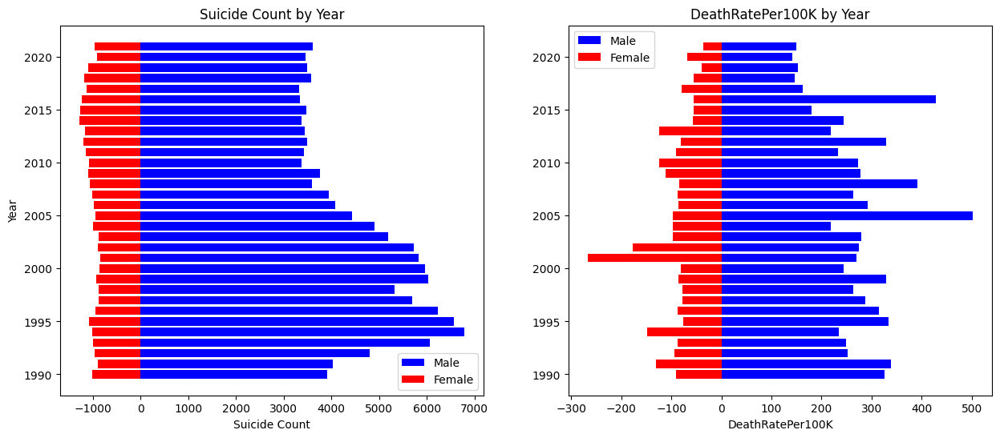

In [19]:
# Male X Female
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6), sharex=False)

# Suicide Count by Year 
ax1.barh(df_male['Year'], df_male['SuicideCount'], color='blue', label='Male')
ax1.barh(df_female['Year'], -df_female['SuicideCount'], color='red', label='Female')
ax1.set_title('Suicide Count by Year')
ax1.set_xlabel('Suicide Count')
ax1.set_ylabel('Year')
ax1.legend()

# DeathRatePer100K by Year
ax2.barh(df_male['Year'], df_male['DeathRatePer100K'], color='blue', label='Male')
ax2.barh(df_female['Year'], -df_female['DeathRatePer100K'], color='red', label='Female')
ax2.set_title('DeathRatePer100K by Year')
ax2.set_xlabel('DeathRatePer100K')
ax2.legend()
plt.show()

<div class="alert alert-block alert-info" style="background-color:#F0EEED;color:#7a7a7a;border-color:black;width:80%;margin: auto;text-align: center;"><b>Insight: </b>The number of suicides is much higher among males than among females. This is repeated for DeathRatePer100K</div>

### <b><span style='color:#DEB078'>5.4 |</span><span style='color:#7a7a7a'> Country</span></b> 

In [20]:
# Highest Countries According to SuicideCount

char_bar = df.groupby(['CountryName'])[['SuicideCount']].sum().reset_index()
char_bar = char_bar.sort_values(by=("SuicideCount"), ascending=False)

top = char_bar.head(10)
fig = go.Figure()
fig.add_trace(go.Bar(x=top['CountryName'], y=top["SuicideCount"]))

fig.update_layout(title='Highest Countries According to SuicideCount',
                          xaxis_title='Countries',
                          yaxis_title= "SuicideCount",
                          plot_bgcolor='#F0EEED', 
                          paper_bgcolor='#F0EEED',  
                          font=dict(color='black'))

pyo.init_notebook_mode(connected=True)
pyo.iplot(fig)

<div class="alert alert-block alert-info" style="background-color:#F0EEED;color:#7a7a7a;border-color:black;width:80%;margin: auto;text-align: center;"><b>Insight: </b>The countries with the highest number of suicides are Russia and the United States. So, let's analyze them a little more.</div>

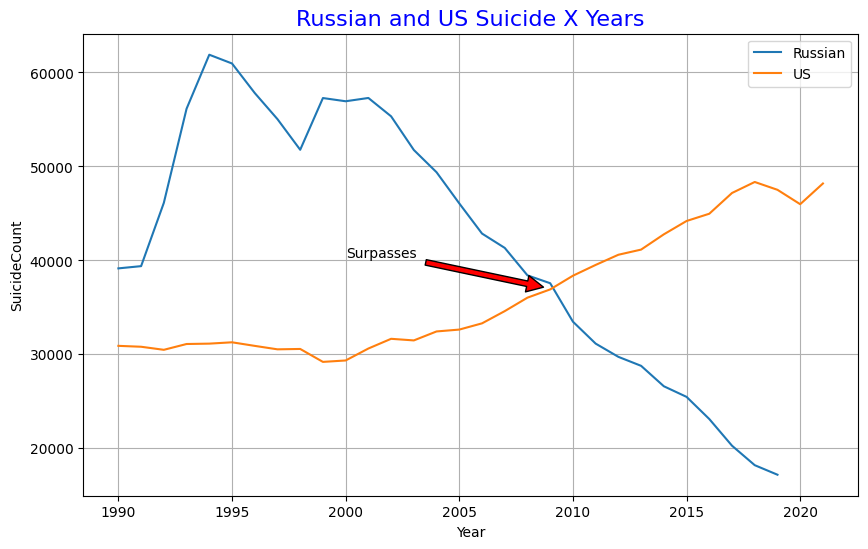

In [21]:
# Create datasets
df_Russian = df[df['CountryName'] == 'Russian Federation']
df_US = df[df['CountryName'] == 'United States of America']

# Groupby - Year
suicide_Russian = df_Russian.groupby('Year')['SuicideCount'].sum().reset_index()
suicide_US = df_US.groupby('Year')['SuicideCount'].sum().reset_index()

# Rename columns
suicide_Russian.rename(columns = {'SuicideCount':'Russian'}, inplace = True)
suicide_US.rename(columns = {'SuicideCount':'US'}, inplace = True)

# Concat datasets 
suicide_Rus_US = pd.concat([suicide_Russian, suicide_US])

# Plot
suicide_Rus_US.plot(x="Year", y=['Russian', 'US'],
              kind="line", figsize=(10, 6))
plt.title("Russian and US Suicide X Years", fontsize = 16, color = 'blue')
plt.ylabel('SuicideCount', rotation=90, fontsize = 10)
plt.annotate('Surpasses',
      horizontalalignment = 'left',
      verticalalignment = 'bottom',
      xytext = (2000, 40000),
      xy = (2009, 37000),
      arrowprops = dict(facecolor = 'red', shrink = 0.05))

plt.grid()
plt.show()


<div class="alert alert-block alert-info" style="background-color:#F0EEED;color:#7a7a7a;border-color:black;width:80%;margin: auto;text-align: center;"><b>Insight: </b>We can graphically see that Russia had a greater number of suicides until 2009. From then on, the United States began to have the highest number of suicides.</div>

In [22]:
# Highest Countries According to DeathRatePer100K

char_bar = df.groupby(['CountryName'])[['DeathRatePer100K']].sum().reset_index()
char_bar = char_bar.sort_values(by=("DeathRatePer100K"), ascending=False)

top = char_bar.head(10)
fig = go.Figure()
fig.add_trace(go.Bar(x=top['CountryName'], y=top["DeathRatePer100K"]))

fig.update_layout(title='Highest Countries According to DeathRatePer100K',
                          xaxis_title='Countries',
                          yaxis_title= "Death Rate Per 100K",
                          plot_bgcolor='#F0EEED', 
                          paper_bgcolor='#F0EEED',  
                          font=dict(color='black'))

pyo.init_notebook_mode(connected=True)
pyo.iplot(fig)

<div class="alert alert-block alert-info" style="background-color:#F0EEED;color:#7a7a7a;border-color:black;width:80%;margin: auto;text-align: center;"><b>Insight: </b>The countries with the highest DeathRatePer100K are Lithuania and the Hungary.</div>

In [23]:
# Suicide X Years by Country - Choropleth
fig = px.choropleth(df,
                    locations='CountryName', locationmode='country names',
                    color = 'SuicideCount',hover_name="CountryName",
                    animation_frame="Year",
                    color_continuous_scale='Viridis_r')
fig.update_layout(margin={'r':0,'t':0,'l':0,'b':0}, coloraxis_colorbar=dict(
    title = 'Suicide Count',
    ticks = 'outside',
    tickvals = [5000,10000,15000,20000,30000, 40000, 50000],
    dtick = 12))              
fig.show()

## <b><div style='padding:15px;background-color:#7a7a7a;color:white;border-radius:40px;font-size:110%;text-align: center'>If you liked it, please upvote. Thank you very much.</div></b>